### Get the workspace ready

* Import TensorFlow 2
* Import Tensor Flow Hub
* Make sure we are using GPU 

In [1]:
# import tools
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

from sklearn.model_selection import train_test_split
# check for GPU availability
print(tf.config.list_physical_devices("GPU"))
print(tf.test.gpu_device_name())

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
/device:GPU:0


  ## Turning data into Tensors (numeric representation)

In [2]:
labels_csv = pd.read_csv("drive/MyDrive/dog-breed-identification/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
labels_csv.info()
labels_csv.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

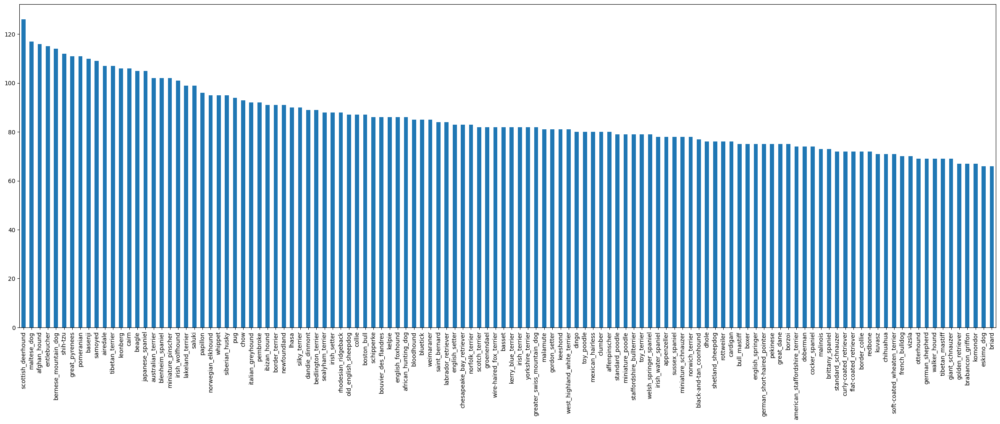

In [4]:
labels_csv.breed.value_counts().plot.bar(figsize=(30, 10))

In [5]:
labels_csv.breed.value_counts().mean(), labels_csv.breed.value_counts().median(), labels_csv.breed.value_counts().mode()

(85.18333333333334,
 82.0,
 0    82
 Name: breed, dtype: int64)

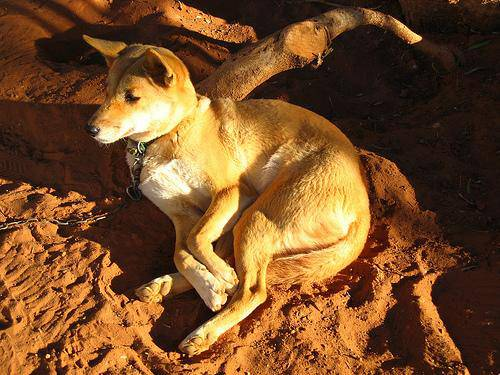

In [6]:
from IPython.display import Image
Image("drive/MyDrive/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Getting list of all out image file pathnames

In [7]:
path_to_image = "drive/MyDrive/dog-breed-identification/train/"
file_extension = ".jpg"
filenames = [path_to_image + fname + file_extension for fname in labels_csv.id]
filenames[:5]

['drive/MyDrive/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [8]:
# Check if number of filenames matches number of actual image files
import os
if len(os.listdir(path_to_image)) == len(filenames):
  print(f"Same amount of data: {len(filenames)}")
else:
  print(f"Files in train: {len(os.listdir(path_to_image))}\n"
        f"Files in notebook: {len(filenames)}")

Same amount of data: 10222


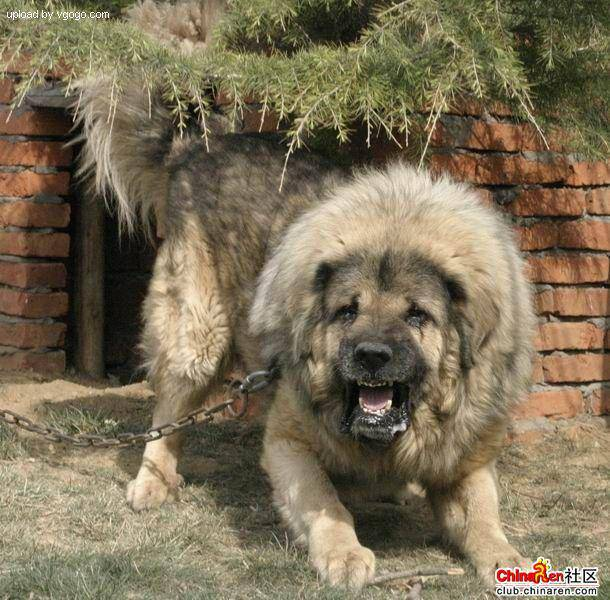

In [9]:
Image(filenames[9000])

In [10]:
labels_csv.breed[9000]

'tibetan_mastiff'

### Turn labels into numeric data

In [11]:
labels = labels_csv.breed.to_numpy()

In [12]:
# Check if number of filenames matches number of labels
# if len(filenames) == len(labels):
#   print(f"Same amount of data: {len(labels)}")
# else:
#   print(f"Files in train: {len(filenames)}\n"
#         f"Files in notebook: {len(labels)}")

In [13]:
# My naive approach to give numerical values to labels for practice
# labels_dict = {}
# for idx, val in enumerate(set(labels_csv.breed)):
#   labels_dict[val] = idx + 1
# all_labels = labels_csv.breed.copy()
# for i in range(len(all_labels)):
#   all_labels[i] = labels_dict[all_labels[i]]

In [14]:
unique_breeds = np.unique(labels)
unique_breeds


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [17]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
labels[0]

'boston_bull'

In [19]:
np.where(unique_breeds == labels[0])

(array([19]),)

In [20]:
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [21]:
# # single cell of the whole conversion from string labels to boolean arrays
# labels = labels_csv.breed.to_numpy()
# unique_breeds = np.unique(labels)
# boolean_labels = [label == unique_breeds for label in labels]

### Creating validation set

In [22]:
X = filenames
y = boolean_labels

# set a number of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:100, max:10222}

In [23]:
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=.2,
                                                  random_state=42)

In [24]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [25]:
X_train[:2], y_train[:2]

(['drive/MyDrive/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

In [26]:
X_val[:2], y_val[:2]

(['drive/MyDrive/dog-breed-identification/train/0ca9280205bd68d201e1d708db3f209d.jpg',
  'drive/MyDrive/dog-breed-identification/train/12405b2e93417d81f5308769c4e184c7.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

### Turning images into Tensors

In [27]:
# Convert image to NumPy array

image = plt.imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
# Convert NumpYarray to Tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [29]:
# Define image size
IMG_SIZE = 224

# Turn image into tensors
def process_image(image_path, img_size=IMG_SIZE):
  """Takes an image path and turns it into a Tensor"""
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## Turning data into Batches

To use TensorFlow effectively, we need the data in the form of Tensor Tuples: `(image, label)`

In [30]:
def get_image_and_label(image_path, label):
  """
  Takes an image file path name and associated label,
  processes the image and returns a tuple (image, label)
  """
  return process_image(image_path), label

In [31]:
# get_image_and_label(X[42], tf.constant(y[42]))

In [32]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, test_data=False, valid_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data.
  Doesn't shuffle if it is validation data.
  Accepts test data as input (y=None).
  """

  if test_data:
    print("Creating TEST data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  if valid_data:
    print("Creating VALID data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_and_label).batch(BATCH_SIZE)
    return data_batch

  print("Creating TRAIN data batches...")
  data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                            tf.constant(y)))
  data = data.shuffle(buffer_size=len(X))

  return data.map(get_image_and_label).batch(BATCH_SIZE)
  

In [33]:
create_data_batches(X[:22], test_data=True)

Creating TEST data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [34]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating TRAIN data batches...
Creating VALID data batches...


In [35]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [36]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [37]:
# for el in train_data:
#   print(el)
#   break

## Visualising Data Batches

In [38]:
def show_25_images(images, labels):
  """
  DIsplays a plot of 25 images and their labels from a data batch
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [39]:
# train_images, train_labels = next(iter(train_data))
train_images, train_labels = next(train_data.as_numpy_iterator())

In [40]:
train_labels, train_images

(array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]),
 array([[[[2.05357134e-01, 1.09908953e-01, 1.00099251e-01],
          [6.93959951e-01, 2.01663032e-01, 3.27853501e-01],
          [7.08805919e-01, 1.61129072e-01, 2.96697199e-01],
          ...,
          [4.91643906e-01, 5.58310568e-01, 5.89683115e-01],
          [4.76768255e-01, 5.40686429e-01, 5.88147521e-01],
          [4.72175896e-01, 5.34920990e-01, 5.85901380e-01]],
 
         [[2.15406314e-01, 1.06722996e-01, 1.02521315e-01],
          [6.76782489e-01, 1.84381902e-01, 3.10606927e-01],
          [6.85960889e-01, 1.39604688e-01, 2.74265409e-01],
          ...,
          [4.67682868e-01, 5.34349561e-01, 5.73565245e-01],
          

In [41]:
len(train_labels), len(train_images)

(32, 32)

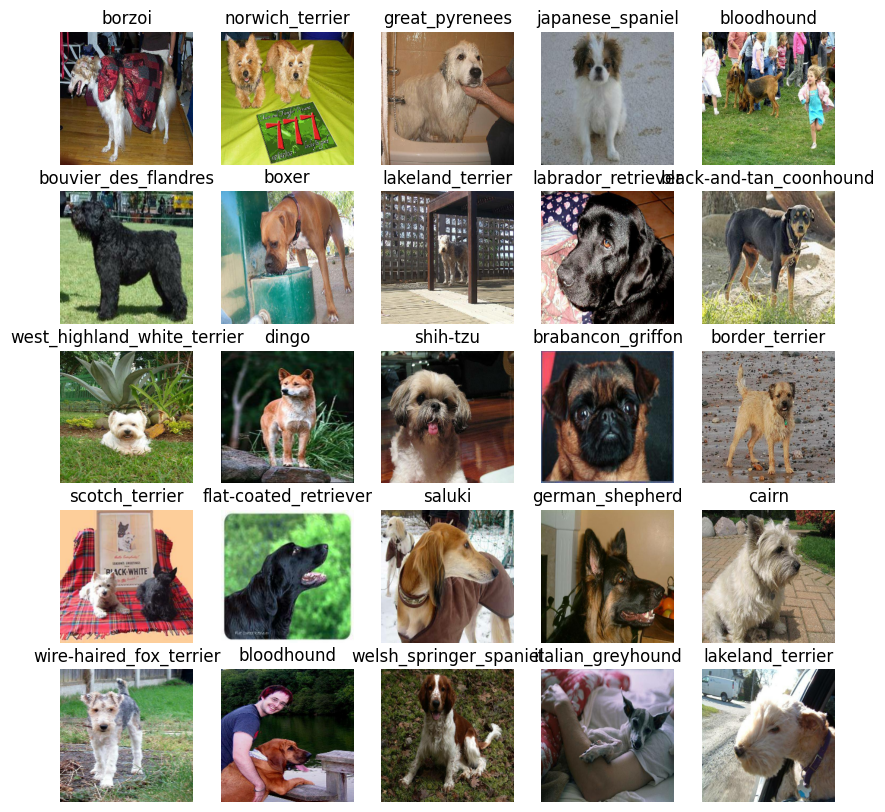

In [42]:
show_25_images(train_images, train_labels)

In [43]:
val_images, val_labels = next(val_data.as_numpy_iterator())

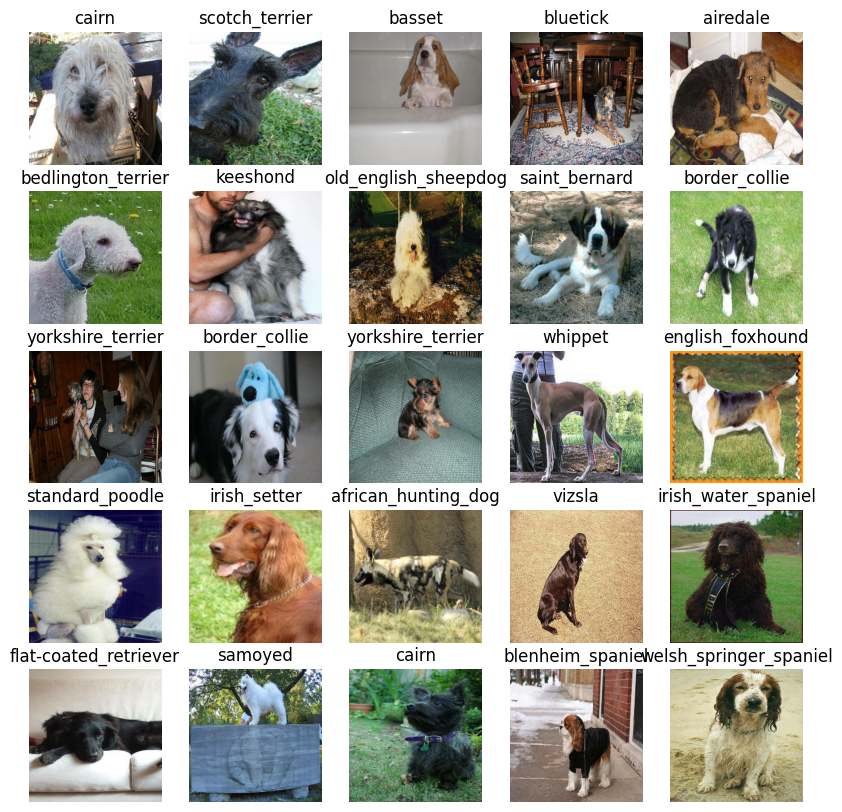

In [44]:
show_25_images(val_images, val_labels)

## Building a model
Things to be defined
* Input shape to the model
* Output shape to the model
* The URL of the model

In [45]:
# Setup the input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
# Setup the output shape of the model
OUTPUT_SHAPE = len(unique_breeds)
# get the url
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Create a function which:
* Takes the input shape, output shame and model
* Defines the layers in a Keras model in sequential fashion
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the inpust shape it'll be getting)
* Returns the model

In [46]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"Building model with: {model_url}")

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape, # Layer 2 (output layer)
                            activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [47]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use to do such things as:
* save its progress
* check its progress
* stop training early if a model stops improving


### TensorBoard callback

In [48]:
# Load TensorBOard notebook extension

In [49]:
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [50]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model

In [51]:
NUM_EPOCHS = 100 #@param {type:"slider"}

In [52]:
def train_model():
  """
  Trains a model and returns the trained version
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [53]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 154s 6s/step - loss: 4.7043 - accuracy: 0.0875 - val_loss: 3.6523 - val_accuracy: 0.2200
Epoch 2/100
25/25 [==============================] - 3s 118ms/step - loss: 1.6961 - accuracy: 0.6488 - val_loss: 2.3158 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 165ms/step - loss: 0.5981 - accuracy: 0.9225 - val_loss: 1.7432 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 168ms/step - loss: 0.2653 - accuracy: 0.9850 - val_loss: 1.5141 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 119ms/step - loss: 0.1544 - accuracy: 0.9962 - val_loss: 1.4237 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 136ms/step - loss: 0.1045 - accuracy: 0.9987 - val_loss: 1.3823 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================]

In [54]:
%load_ext tensorboard

In [55]:
%tensorboard --logdir drive/MyDrive/dog-breed-identification/logs/

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predicitons using a trained model

In [56]:
# Make predictions on validation batch
predictions = model.predict(val_data, verbose=1)


7/7 [==============================] - 5s 148ms/step


In [57]:
predictions

array([[4.2849628e-04, 2.7593836e-05, 2.8274066e-03, ..., 4.9425609e-05,
        3.0911855e-05, 6.5075612e-04],
       [9.1673713e-04, 2.4996925e-04, 5.9255841e-03, ..., 7.5236126e-04,
        2.2623970e-04, 3.5400149e-05],
       [2.1818523e-06, 2.4654673e-05, 6.8850914e-06, ..., 6.0525746e-04,
        8.8253100e-06, 2.9310057e-05],
       ...,
       [1.0054532e-06, 9.1149624e-05, 1.4621951e-04, ..., 2.0353646e-06,
        1.6036167e-05, 4.1865511e-05],
       [4.1813543e-03, 1.7805029e-04, 1.9629204e-05, ..., 2.8100219e-05,
        2.6932352e-05, 7.1991743e-03],
       [1.3241994e-03, 2.1175916e-05, 1.9947304e-03, ..., 6.7657875e-03,
        2.5936507e-03, 4.7975744e-04]], dtype=float32)

In [58]:
# first predcition
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.84422370e-05 1.03592902e-04 2.21941154e-05 8.54245081e-05
 1.01453741e-03 5.55906590e-05 9.48915476e-05 1.14201941e-03
 2.67868433e-02 4.81061302e-02 1.36602917e-04 2.19371141e-05
 7.74084649e-04 9.36314836e-03 6.25728746e-04 1.46418519e-03
 2.17235938e-05 5.01037692e-04 1.39185620e-04 1.04652764e-03
 3.56089804e-05 2.24867734e-04 3.63814579e-05 2.74104914e-05
 9.27417632e-03 3.36576522e-05 1.16486415e-04 6.94557311e-05
 7.24009064e-04 7.51590924e-05 1.60420059e-05 6.41353545e-05
 2.75268267e-05 3.89688248e-05 6.15931049e-06 2.52281607e-05
 2.75058337e-05 3.20355670e-04 4.54570509e-05 2.65052617e-01
 8.94706027e-05 7.89816659e-06 5.95783954e-03 8.50756078e-06
 5.94284153e-04 4.23224155e-05 1.14541857e-04 6.80303725e-04
 8.91660748e-05 8.87123024e-05 6.41351071e-05 1.05541338e-04
 9.63901519e-04 7.46766455e-04 2.77429608e-05 2.72506615e-04
 1.60102078e-04 7.10633685e-05 1.24771483e-04 1.54033805e-05
 1.87457954e-05 2.12836335e-03 1.84513683e-05 6.43618187e-05
 3.04220339e-05 1.532697

In [59]:
def get_pred_label(prediction_probabilities):
  # print(prediction_probabilities)
  # print(f"Max value (probability of prediction_probabilities): {np.max(prediction_probabilities)}")
  # print(f"Sum: {np.sum(prediction_probabilities)}")
  # print(f"Max index: {np.argmax(prediction_probabilities)}")
  # print(f"Predicted label: {unique_breeds[np.argmax(prediction_probabilities)]}")
  return unique_breeds[np.argmax(prediction_probabilities)]

In [60]:
get_pred_label(predictions[42])

'walker_hound'

In [61]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [62]:
images_unbatched = []
labels_unbatched = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_unbatched.append(image)
  labels_unbatched.append(label)


In [63]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors
  Returns separate arrays of images and labels
  """
  images_unbatched = []
  labels_unbatched = []

  for image, label in data.unbatch().as_numpy_iterator():
    images_unbatched.append(image)
    labels_unbatched.append(unique_breeds[np.argmax(label)])
  return images_unbatched, labels_unbatched

In [64]:
val_images, val_labels = unbatchify(val_data)

In [65]:
val_labels[0]

'cairn'

In [66]:
val_images[0].dtype

dtype('float32')

In [67]:
def show_image_label_and_prediction(idx):
  """
  Function which shows the image and actual and predicted labels for a given idx
  It relies on external arrays and is used here for convenience and practice
  """
  plt.imshow(val_images[idx])
  plt.title(f"Actual: {val_labels[idx]}\nPredicted: {get_pred_label(predictions[idx])}")
  plt.axis("off");

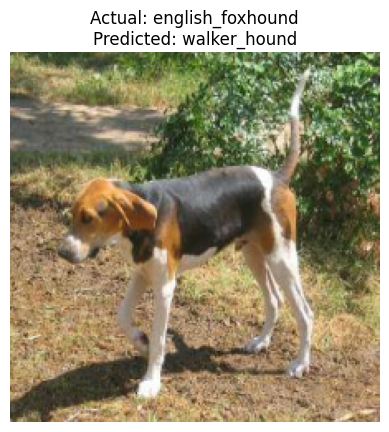

In [68]:
show_image_label_and_prediction(42)

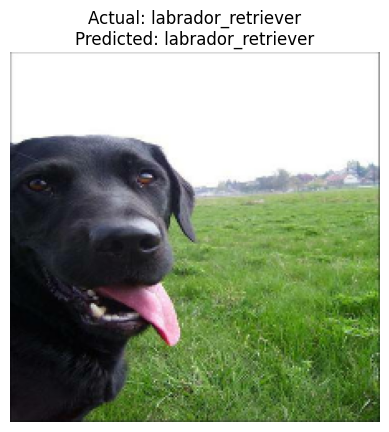

In [69]:
show_image_label_and_prediction(40)

In [70]:
def plot_pred(prediciton_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediciton_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title(f"{pred_label} {np.max(pred_prob)*100:.2f}% {true_label}", color=color)

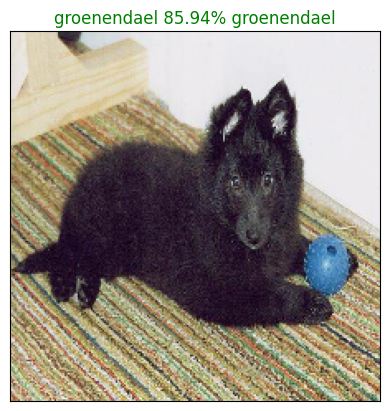

In [71]:
plot_pred(prediciton_probabilities=predictions, labels=val_labels, images=val_images, n=77)

In [72]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for samle n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_vals = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_vals,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation=90)
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

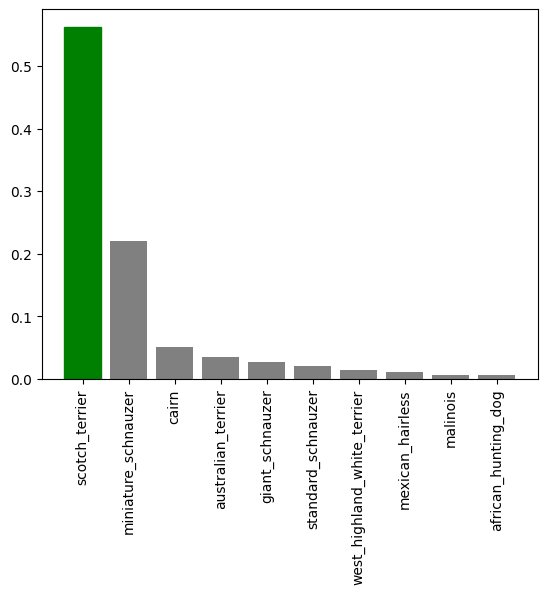

In [73]:
plot_pred_conf(predictions, val_labels)

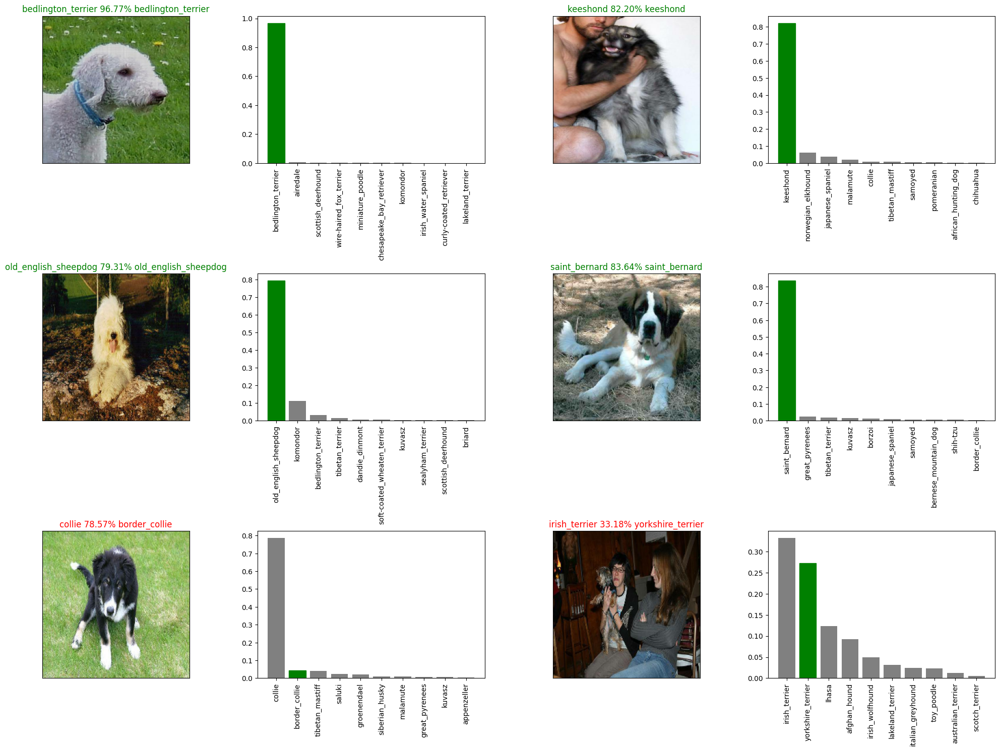

In [74]:
i_multiplier = 5
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * 
  num_cols, 2 * i + 1)
  plot_pred(prediciton_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad=1)
plt.show()

<Axes: >

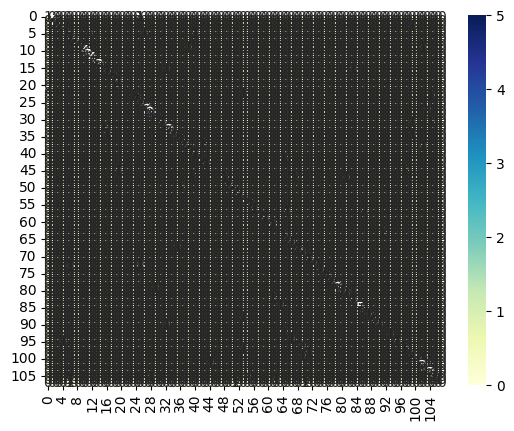

In [75]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
predicted_breeds = [get_pred_label(prediction) for prediction in predictions]
cnf_matrix = confusion_matrix(val_labels, predicted_breeds)
sns.heatmap(cnf_matrix, annot=True, cmap="YlGnBu")

## Saving and reloading a trained model

In [76]:
def save_model(model, suffix=None):
  """
  Saves a model in a models directory and appends a suffix
  """
  modeldir = os.path.join("drive/MyDrive/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + '-' + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [77]:
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved file from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [78]:
path = save_model(model, suffix="1000_images")

Saving model to: drive/MyDrive/dog-breed-identification/models/20230605-135257-1000_images.h5


In [79]:
reloaded_model = load_model(path)

Loading saved file from: drive/MyDrive/dog-breed-identification/models/20230605-135257-1000_images.h5


In [80]:
model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.2200 - accuracy: 0.6750


[1.2200331687927246, 0.675000011920929]

In [81]:
reloaded_model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2200 - accuracy: 0.6750


[1.2200331687927246, 0.675000011920929]

## Train on full data

In [82]:
len(X), len(y)

(10222, 10222)

In [83]:
# Create a data batch with the full data_set
full_data = create_data_batches(X, y)

Creating TRAIN data batches...


In [84]:
len(full_data), full_data

(320,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [85]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [86]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [87]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 105ms/step - loss: 1.3478 - accuracy: 0.6660
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.4029 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2389 - accuracy: 0.9315
Epoch 4/100
320/320 [==============================] - 35s 110ms/step - loss: 0.1539 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1086 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0794 - accuracy: 0.9855
Epoch 7/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0588 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0469 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0380 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 33s 103m

In [88]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog-breed-identification/models/20230605-140433-full-image-set-mobilenetv2-Adam.h5


'drive/MyDrive/dog-breed-identification/models/20230605-140433-full-image-set-mobilenetv2-Adam.h5'

In [89]:
loaded_full_model = load_model("drive/MyDrive/dog-breed-identification/models/20230604-225224-full-image-set-mobilenetv2-Adam.h5")

Loading saved file from: drive/MyDrive/dog-breed-identification/models/20230604-225224-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

In [90]:
folder_path = "drive/MyDrive/dog-breed-identification/test/"

test_filenames = [folder_path + fname for fname in os.listdir(folder_path)]
# test_filenames = [os.path.join(dirpath, filename)
#                   for dirpath, _, filenames in os.walk(folder_path)
#                     for filename in filenames]


In [91]:
test_batches = create_data_batches(test_filenames, test_data=True)

Creating TEST data batches...


In [92]:
latest_predictions = loaded_full_model.predict(test_batches, verbose=1)

324/324 [==============================] - 190s 564ms/step


In [93]:
np.savetxt("drive/MyDrive/dog-breed-identification/preds_array.csv", latest_predictions, delimiter=',')

In [94]:
test_predicitons = np.loadtxt("drive/MyDrive/dog-breed-identification/preds_array.csv", delimiter=',')

In [95]:
len(test_predicitons)

10357

In [96]:
test_predicitons.shape

(10357, 120)

In [158]:
test_predicitons[0]

array([3.97361137e-12, 4.93339599e-07, 1.55529289e-09, 1.59086581e-11,
       3.27750672e-06, 2.82520546e-07, 7.62101937e-10, 1.86855011e-08,
       9.93950129e-01, 1.12541820e-05, 8.57804389e-06, 2.97382535e-10,
       6.48052634e-08, 1.73035932e-08, 3.70360067e-05, 5.02609964e-07,
       9.40667891e-11, 1.01781905e-09, 1.61011648e-10, 1.21095078e-10,
       5.28982587e-12, 1.85854822e-06, 7.01475189e-09, 8.41434655e-09,
       7.77705111e-07, 2.32349071e-10, 1.96014247e-10, 4.31416430e-11,
       4.43422550e-06, 1.55688601e-10, 8.45822301e-10, 5.10598533e-03,
       6.50590402e-04, 3.81136372e-11, 5.57758506e-09, 1.31962338e-06,
       2.62963644e-11, 6.74075379e-11, 3.51341872e-10, 3.57020617e-05,
       2.81961115e-06, 1.06522080e-07, 2.53897727e-12, 6.64497485e-11,
       1.08848364e-09, 1.45371715e-07, 2.59061501e-12, 3.62727413e-08,
       3.84195653e-09, 9.40260350e-08, 7.21684357e-09, 4.70051219e-07,
       5.03413958e-07, 4.53821092e-10, 5.17458602e-12, 7.25765949e-06,
      

In [156]:
ids = [fname.split(".")[0] for fname in  os.listdir(folder_path)]

In [170]:
preds_df = pd.DataFrame(columns=['id', *unique_breeds])
preds_df['id'] = ids
preds_df[list(unique_breeds)] = test_predicitons
# for i in range(20):
  # preds_df.loc[i] = [ids[i], *(test_predicitons[i])]

In [171]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ddd7f84a932ec7213b9c1f6de8c09262,3.973611e-12,4.933396e-07,1.555293e-09,1.590866e-11,3.277507e-06,2.825205e-07,7.621019e-10,1.868550e-08,9.939501e-01,...,1.198140e-10,2.491387e-10,7.587936e-06,9.320396e-08,5.516802e-07,9.666847e-08,5.500959e-08,5.785524e-05,9.916755e-09,2.726671e-11
1,de30e8d3cfd89cb021800007879f271b,1.527355e-08,8.755706e-12,3.737101e-10,5.003218e-13,2.376848e-12,1.104167e-09,8.101242e-12,5.620639e-12,2.228452e-11,...,6.748412e-11,1.768466e-06,1.401468e-11,1.247183e-12,3.957809e-14,8.329582e-12,9.421570e-11,5.989031e-12,1.719488e-07,4.620671e-08
2,e5507ebc0e05513bf543e160a484666f,1.994566e-06,4.557450e-05,2.908086e-08,1.249406e-05,6.258901e-09,1.813923e-10,2.310905e-11,1.710368e-08,5.488207e-09,...,6.100376e-06,6.304631e-10,4.601324e-08,1.948249e-08,6.411798e-10,6.106106e-09,2.102809e-09,3.513379e-08,1.199966e-05,8.029655e-07
3,e22127411f6347464f3e91a775bd0245,2.576252e-10,1.077266e-05,1.244516e-10,5.927523e-10,5.738235e-09,5.496538e-08,7.649429e-09,5.184409e-09,1.421251e-11,...,1.086806e-09,5.141952e-10,4.685141e-10,1.163446e-08,8.284863e-10,7.315429e-09,3.502359e-12,8.766279e-10,2.060764e-09,1.850290e-09
4,df2a003a0b1a216effd806f03f703859,3.816186e-11,1.969265e-06,3.883426e-10,2.653340e-08,3.068995e-11,8.766498e-06,1.201987e-11,8.910838e-11,8.757822e-08,...,1.588420e-09,6.896480e-13,4.961556e-08,1.960096e-08,6.586045e-08,3.513197e-10,2.788217e-09,7.330786e-09,1.392650e-11,1.254027e-10


In [172]:
preds_df.to_csv("drive/MyDrive/dog-breed-identification/full_model_preds_sub1_mobilenetV2.csv",
                index=False)